In [1]:
# General utilities
import warnings  # To suppress warnings
warnings.simplefilter(action='ignore')  # Suppress warnings globally
import os  # For operating system interactions (e.g., file paths)
import random  # For randomization

# Data manipulation and mathematical operations
import numpy as np  # For numerical computations

# Image processing
import cv2  # OpenCV for image processing
import zipfile
from shutil import copyfile
# Visualization libraries

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns  # For enhanced visualizations
from sklearn.metrics import ConfusionMatrixDisplay  # For visualizing confusion matrices

# TensorFlow and Keras (Deep Learning Framework)
import tensorflow as tf  # TensorFlow core library
from tensorflow.keras.optimizers import Adam, Nadam, RMSprop  # Optimizers for model training
from tensorflow.keras.models import Model  # Base class for Keras models
from tensorflow.keras.layers import (  # Neural network layers
    Input,
    Conv2D,
    MaxPooling2D,
    Activation,
    Dense,
    BatchNormalization,
    GlobalAveragePooling2D
)
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # For data augmentation and preprocessing


In [2]:
## Conection with Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## Load and extract the dataset
input_path = "/content/drive/MyDrive/dataset.zip"

local_zip = input_path
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/content/drive/MyDrive/')
zip_ref.close()

In [ ]:
## Load and extract the dataset
input_path = "/content/drive/MyDrive/Splitted_data2.zip"

local_zip = input_path
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/content/drive/MyDrive/')
zip_ref.close()

In [3]:
#  Shorrtcut varibales for path
My_Drive = "/content/drive/MyDrive/"
Testing_Images = My_Drive+ "/TestingRandomeImages"

data_dir = "/content/drive/MyDrive/Splitted_data2/"
SavedModels_MOBILENETV2 = "/content/drive/MyDrive/SavedModels/MOBILENETV2_Ver4"
data_path = "/content/drive/MyDrive/dataset"

### **Display some images**

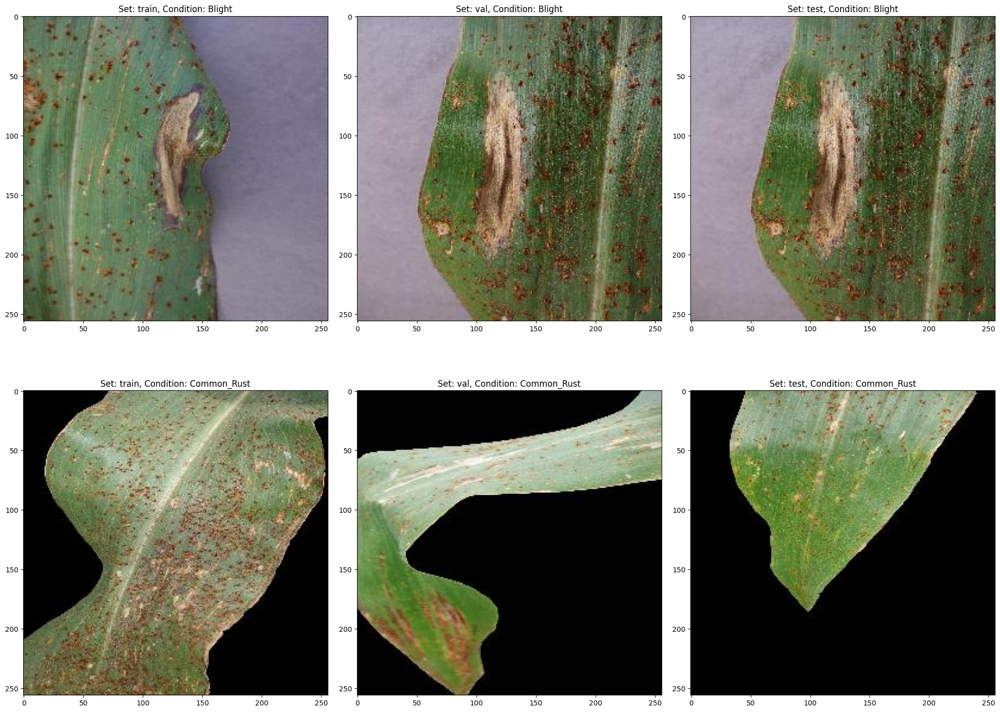

In [4]:
##
# This code visualizes sample images from two conditions (Blight and Common Rust)
# for each dataset split (train, val, and test)
path_ = data_dir+'/'

fig, ax = plt.subplots(2,3,figsize=(20,15))
ax = ax.ravel()
plt.tight_layout()
# Set up the plotting environment:
for i, set_ in enumerate(['train','val', 'test']):
    set_path = path_+ set_
    # Display images for the "Blight" condition:
    ax[i].imshow(plt.imread(set_path+'/Blight/'+os.listdir(set_path+'/Blight')[0]))
    ax[i].set_title('Set: {}, Condition: Blight'.format(set_))
    # Display images for the "Common Rust" condition:
    ax[i+3].imshow(plt.imread(set_path+'/Common_Rust/'+os.listdir(set_path+'/Common_Rust')[0]))
    ax[i+3].set_title('Set: {}, Condition: Common_Rust'.format(set_))

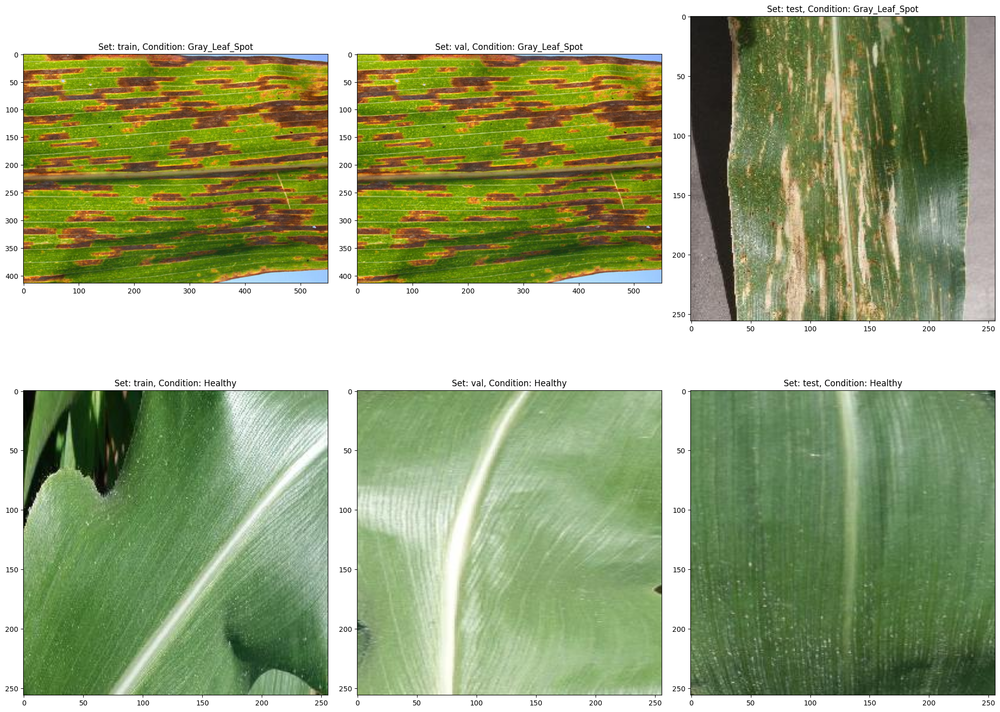

In [5]:
fig, ax = plt.subplots(2,3,figsize=(20,15))
ax = ax.ravel()
plt.tight_layout()

for i, set_ in enumerate(['train','val','test']):
    set_path = path_+ set_

    # Displaying images for the Gray_Leaf_Spot condition:
    ax[i].imshow(plt.imread(set_path+'/Gray_Leaf_Spot/'+os.listdir(set_path+'/Gray_Leaf_Spot')[0]))
    ax[i].set_title('Set: {}, Condition: Gray_Leaf_Spot'.format(set_))

    # Displaying images for the Healthy condition:
    ax[i+3].imshow(plt.imread(set_path+'/Healthy/'+os.listdir(set_path+'/Healthy')[0]))
    ax[i+3].set_title('Set: {}, Condition: Healthy'.format(set_))

# Preproceesing & Augmentation for the images

In [6]:

# to create training and validation data generators for image data preprocessing.
def train_val_test_data(img_dims, batch_size):

  ## Training data generator with augmentationa
  train_datagen = ImageDataGenerator(rescale = 1./255,
                                       rotation_range = 40, # Randomly rotate images by up to 40 degrees.
                                       width_shift_range = .2,
                                       height_shift_range = .2,
                                       shear_range = .2,# Apply random shearing transformations.
                                       zoom_range = 0.3,
                                       horizontal_flip = True,
                                       vertical_flip=True,
                                       brightness_range=[0.5, 1.5], # Randomly adjust brightness within the specified range.
                                       featurewise_center=True,
                                       featurewise_std_normalization=True, # Normalize images based on dataset standard deviation.
                                       fill_mode = 'nearest', # Fill missing pixels after transformations with the nearest pixel value.
                                   )


  ## Train generator
  train_gen = train_datagen.flow_from_directory(directory = path_ + 'train',
                                                  target_size = (img_dims, img_dims),  # Resize all images to the specified dimensions.
                                                  batch_size = batch_size,  # Number of images per batch.
                                                  class_mode = 'categorical', # Multi-class classification mode; one-hot encodes labels.
                                                  shuffle = True) # Shuffle the data to enhance randomness during training.

  ## Validation Data minimal preprocessing, no augmentation)
  validation_datagen = ImageDataGenerator(rescale = 1./255)

  ## validation generator
  val_gen = validation_datagen.flow_from_directory(directory = path_ + 'val',
                                                      target_size = (img_dims, img_dims),
                                                      batch_size = batch_size,
                                                      class_mode = 'categorical',
                                                      shuffle = True)
  ## Test data generator (minimal preprocessing, no augmentation)
  test_datagen = ImageDataGenerator(rescale=1./255)
  ## Test generator
  test_gen = test_datagen.flow_from_directory(
        directory=path_ + 'test',  # Path to the test directory.
        target_size=(img_dims, img_dims),  # Resize test images.
        batch_size=batch_size,  # Number of test images per batch.
        class_mode='categorical',  # Ensure categorical labels are returned.
        shuffle=False  # Do not shuffle test data to maintain order for evaluation.
    )


  return train_gen, val_gen, test_gen

In [7]:
# Set the dimensions for resizing images and the batch size for data generators
img_dims = 224  # The dimensions (224x224) to which all images will be resized.
batch_size = 128 # Number of images in each batch for training and validation.

# Call the train_val_test_data function to create data generators
train_gen, val_gen , test_gen= train_val_test_data(img_dims, batch_size)

Found 4037 images belonging to 4 classes.
Found 800 images belonging to 4 classes.
Found 803 images belonging to 4 classes.


# Modeling Building for MobileNetV2

In [9]:

# List all physical devices of type 'GPU' available in the system
devices = tf.config.list_physical_devices('GPU')
if devices:
    print("GPU available:", devices[0])
    name_gpu = "GPU:0"
    # Create a distribution strategy for running computations on the GPU
    strategy = tf.distribute.OneDeviceStrategy(device=name_gpu)
else:
    print("No GPU found. Using CPU instead.")
    strategy = tf.distribute.OneDeviceStrategy(device="CPU")

GPU available: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [10]:
def mobilenetv2():
# Load the pre-trained MobileNetV2 model
  mobilenet_m = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=(
        img_dims,img_dims,3),
        include_top = False, # Exclude the fully connected layers at the top
        weights = 'imagenet' # Load pre-trained weights from ImageNet
      )
  x = mobilenet_m.trainable = False # Ensures the pre-trained layers are not updated during training

  # Get the output of the MobileNetV2 base model
  x = mobilenet_m.output

# Add a global average pooling layer to reduce the spatial dimensions
  x = GlobalAveragePooling2D()(x)

  # Add a fully connected output layer with softmax activation for multi-class classification
  out = Dense(4,activation='softmax')(x)

 # Create the final model by specifying inputs and outputs
  model = Model(inputs = mobilenet_m.inputs, outputs = out)

  # Print the model architecture summary for verification
  model.summary()

  return model

In [11]:
# Use the distribution strategy scope for efficient computation on the specified device (GPU/CPU)

with strategy.scope():
  # Create the MobileNetV2 model using the defined function
  mobilenetv2_model = mobilenetv2()
  # Compile the model
  mobilenetv2_model.compile(loss = 'categorical_crossentropy',
                            optimizer = Adam(learning_rate = .0001),
                            metrics = ['accuracy'])

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,263,108 (8.63 MB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [12]:
epochs_1 = 50

# Trainng the MobileNetV2 model

In [13]:

from math import ceil # Import the ceil function to round up numbers to the nearest integer

# Calculate the number of steps per epoch for training
steps_per_epoch = ceil(train_gen.samples / batch_size)
validation_steps = ceil(val_gen.samples / batch_size)
# `val_gen.samples`: Total number of validation samples in the dataset
# The same logic as `steps_per_epoch` applies here to cover all validation samples.

# Train the model using the training and validation data generators
history_1 = mobilenetv2_model.fit(
    train_gen,
    steps_per_epoch=steps_per_epoch,  # Number of batches to process per epoch
    epochs=epochs_1,
    validation_data=val_gen,
    validation_steps=validation_steps # Number of validation batches to process per epoch
)


Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 958s 31s/step - accuracy: 0.2140 - loss: 1.7101 - val_accuracy: 0.4554 - val_loss: 1.2499
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.4980 - loss: 1.2009 - val_accuracy: 0.6101 - val_loss: 1.0096
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6190 - val_loss: 1.0013
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - accuracy: 0.6422 - loss: 0.9592 - val_accuracy: 0.6964 - val_loss: 0.8426
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 322ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6830 - val_loss: 0.8461
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.7152 - loss: 0.8091 - val_accuracy: 0.7039 - val_loss: 0.7519
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.7113 - val_loss: 0.7420
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.7549 - loss: 0.7092 -

## Evaluation of the Model

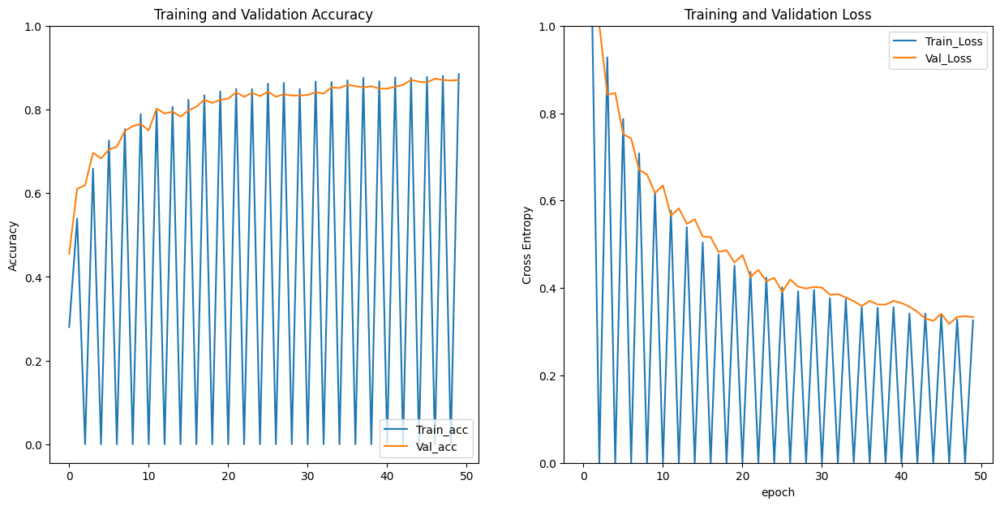

In [14]:
### Loss and accuracy plot

# Extract accuracy values from the training history
acc_mob = history_1.history['accuracy']
val_acc_mob = history_1.history['val_accuracy']


# Extract loss values from the training history
loss_mob = history_1.history['loss']
val_loss_mob = history_1.history['val_loss']

# Plot training and validation accuracy
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.plot(acc_mob, label='Train_acc')
plt.plot(val_acc_mob, label='Val_acc')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(loss_mob, label='Train_Loss')
plt.plot(val_loss_mob, label='Val_Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [15]:
# to evaluate the performance of a trained MobileNetV2 model on a validation dataset using the evaluate method
result_eval = mobilenetv2_model.evaluate(val_gen, verbose =0)

for metric, eval in zip(mobilenetv2_model.metrics_names, result_eval):
  print(metric + ': {:.3}'.format(eval))

loss: 0.326
compile_metrics: 0.873


### Evaluating Confusion matrix for the model

In [16]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## Generate predictions using the test data generator
test_predictions = mobilenetv2_model.predict(test_gen)  # Predict probabilities
test_pred_classes = np.argmax(test_predictions, axis=1)  # Get predicted class indices
test_true_classes = test_gen.classes  # True class labels from the test generator

7/7 ━━━━━━━━━━━━━━━━━━━━ 183s 30s/step


In [17]:

# Define the class labels
class_labels = list(test_gen.class_indices.keys())

# Compute the confusion matrix
cm = confusion_matrix(test_true_classes, test_pred_classes)


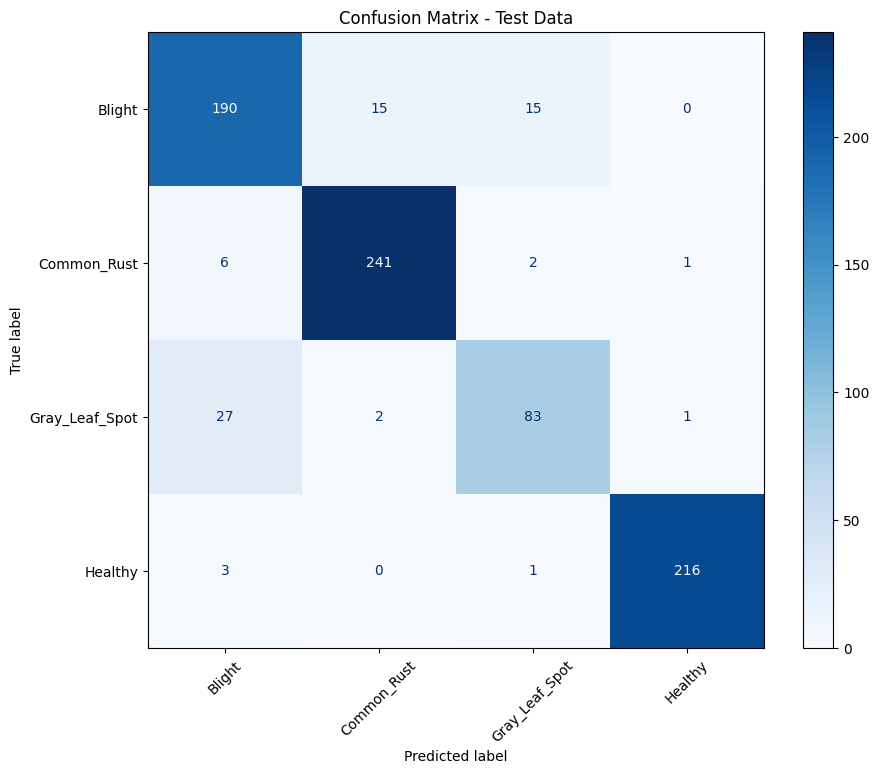

In [18]:
# Plot the confusion matrix
plt.figure(figsize=(10, 8))  # Set figure size
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap='Blues', xticks_rotation=45, ax=plt.gca())  # Plot the confusion matrix
plt.title('Confusion Matrix - Test Data')
plt.show()


In [19]:
from sklearn.metrics import classification_report

# # Generate predictions on the test data
# test_predictions = mobilenetv2_model.predict(test_gen)  # Predict probabilities on the test data
# test_pred_classes = np.argmax(test_predictions, axis=1)  # Get the predicted class indices
# test_true_classes = test_gen.classes  # True class labels from the test generator

# Define the class labels (update with your actual class names if necessary)
class_labels = list(test_gen.class_indices.keys())

# Generate the classification report
report = classification_report(test_true_classes, test_pred_classes, target_names=class_labels)

# Print the classification report
print("Classification Report - Test Data:\n")
print(report)


Classification Report - Test Data:

                precision    recall  f1-score   support

        Blight       0.84      0.86      0.85       220
   Common_Rust       0.93      0.96      0.95       250
Gray_Leaf_Spot       0.82      0.73      0.78       113
       Healthy       0.99      0.98      0.99       220

      accuracy                           0.91       803
     macro avg       0.90      0.89      0.89       803
  weighted avg       0.91      0.91      0.91       803



In [20]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# # Generate predictions on the test data
# test_predictions = mobilenetv2_model.predict(test_gen)  # Predict probabilities on the test data
# test_pred_classes = np.argmax(test_predictions, axis=1)  # Get the predicted class indices
# test_true_classes = test_gen.classes  # True class labels from the test generator

# Calculate metrics
accuracy = accuracy_score(test_true_classes, test_pred_classes)
precision = precision_score(test_true_classes, test_pred_classes, average='weighted')
recall = recall_score(test_true_classes, test_pred_classes, average='weighted')
f1 = f1_score(test_true_classes, test_pred_classes, average='weighted')

# Print metrics
print("Model Evaluation Metrics - Test Data:")
print(f"Accuracy:  {accuracy*100:.2f}%")
print(f"Precision: {precision*100:.2f}%")
print(f"Recall:    {recall*100:.2f}%")
print(f"F1-Score:  {f1*100:.2f}%")


Model Evaluation Metrics - Test Data:
Accuracy:  90.91%
Precision: 90.83%
Recall:    90.91%
F1-Score:  90.82%



# Fine-tuning the model

### Lets Fine-tuning the model for better Performance

we will Un-freeze the top layers of MobileNetV2 model.
 The training will be don for total epochs = 75.
 We will be using Adam optimazer with a low learning rate (base_learning_rate/10) to avoid the overfitting

In [21]:
## Unfreezing layers
mobilenetv2_model.trainable = True

In [22]:
## Fine-tuning
## number of layer in the pre-trained model
print('Number of layer in the pre-trained model:{}'.format(len(mobilenetv2_model.layers)))
fine_tune_at = 100

for layer in mobilenetv2_model.layers[:fine_tune_at]:
  layer.trainable = False
print(f"Trainable Layers: {len(mobilenetv2_model.trainable_variables)}")

Number of layer in the pre-trained model:156
Trainable Layers: 2


In [23]:
# here the code initializes the MobileNetV2 model within distributed training strategy's scope
 # its also compiles it using the Adam optimizer with a reduced learning rate, categorical cross-entropy loss,
#     and accuracy as the evaluation metric.

with strategy.scope():
  mobilenetv2_model.summary() ## here architecture summary is dispayed and
  mobilenetv2_model.compile(loss = 'categorical_crossentropy', optimizer = Adam(learning_rate = 0.0001/10),metrics = ['accuracy'])

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,273,358 (8.67 MB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 10,250 (40.04 KB)

In [24]:
from math import ceil

# Calculate the correct steps per epoch and validation steps
steps_per_epoch = ceil(train_gen.samples / batch_size)
validation_steps = ceil(val_gen.samples / batch_size)

# Perform fine-tuning
fine_tune_epochs = 25
total_epochs = len(history_1.epoch) + fine_tune_epochs  # len(history_1.epoch) = 50

history_fine = mobilenetv2_model.fit(
    train_gen,
    steps_per_epoch=steps_per_epoch,
    epochs=total_epochs,
    initial_epoch=len(history_1.epoch),  # Start fine-tuning after the initial training
    validation_data=val_gen,
    validation_steps=validation_steps,
)


Epoch 51/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 72s 2s/step - accuracy: 0.8805 - loss: 0.3265 - val_accuracy: 0.8720 - val_loss: 0.3189
Epoch 52/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.8807 - loss: 0.3187 - val_accuracy: 0.8735 - val_loss: 0.3257
Epoch 53/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.8571 - val_loss: 0.3439
Epoch 54/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.8938 - loss: 0.3002 - val_accuracy: 0.8690 - val_loss: 0.3313
Epoch 55/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.8735 - val_loss: 0.3203
Epoch 56/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - accuracy: 0.8869 - loss: 0.3130 - val_accuracy: 0.8720 - val_loss: 0.3234
Epoch 57/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 322ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.8705 - val_loss: 0.3302
Epoch 58/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.8790 - loss: 0

In [ ]:
# print(history_1.epoch)

In [25]:
acc_mob += history_fine.history['accuracy']
val_acc_mob += history_fine.history['val_accuracy']

loss_mob += history_fine.history['loss']
val_loss_mob += history_fine.history['val_loss']


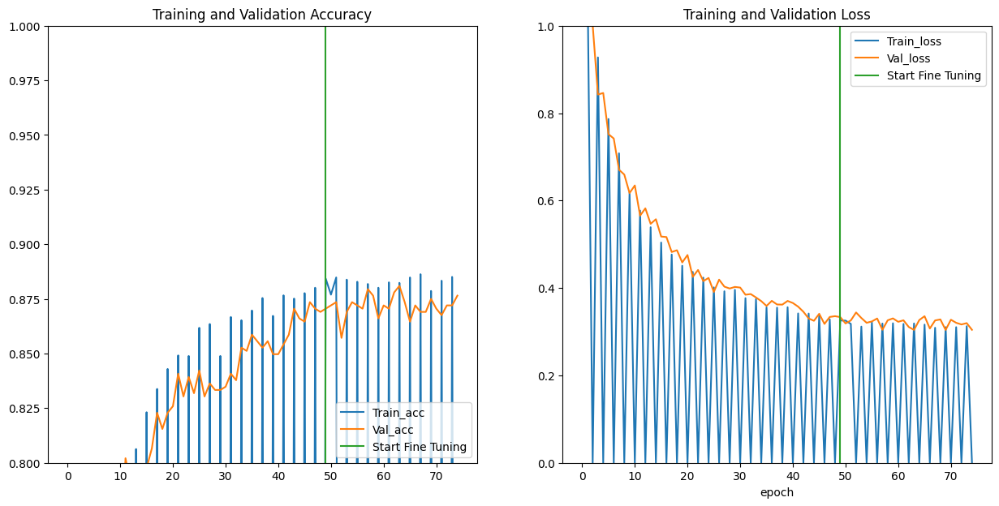

In [26]:
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.plot(acc_mob, label='Train_acc')
plt.plot(val_acc_mob, label='Val_acc')
plt.ylim([0.8, 1])
plt.plot([epochs_1-1,epochs_1-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss_mob, label='Train_loss')
plt.plot(val_loss_mob, label='Val_loss')
plt.ylim([0, 1.0])
plt.plot([epochs_1-1,epochs_1-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [27]:
result_eval_f = mobilenetv2_model.evaluate(val_gen, verbose =0)

for metric_, eval_ in zip(mobilenetv2_model.metrics_names, result_eval_f):
  print(metric_ + ': {:.3}'.format(eval_))

loss: 0.318
compile_metrics: 0.873


 # Model Evaluation with the test set for Fine Tuned Model.

In [28]:

# Generate predictions on the test set
test_predictions = mobilenetv2_model.predict(test_gen)  # Predict probabilities on test data
test_pred_classes = np.argmax(test_predictions, axis=1)  # Convert probabilities to class indices
test_true_classes = test_gen.classes  # True class labels from the test generator


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 602ms/step


In [ ]:
# Generate predictions on the test set
# test_predictions = mobilenetv2_model.predict(test_gen)  # Predict probabilities on test data
# test_pred_classes = np.argmax(test_predictions, axis=1)  # Convert probabilities to class indices
# test_true_classes = test_gen.classes  # True class labels from the test generator


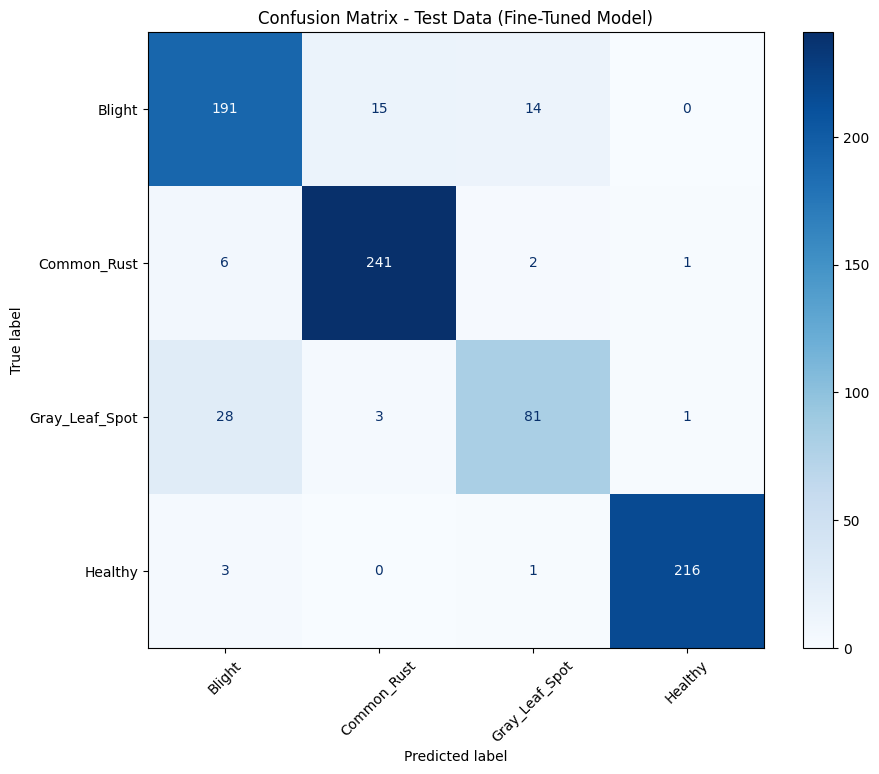

In [29]:


# Compute the confusion matrix
cm = confusion_matrix(test_true_classes, test_pred_classes)

# Define class labels (update with your actual class names if necessary)
class_labels = list(test_gen.class_indices.keys())

# Plot the confusion matrix
plt.figure(figsize=(10, 8))  # Set figure size
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap='Blues', xticks_rotation=45, ax=plt.gca())  # Plot with a blue color map
plt.title('Confusion Matrix - Test Data (Fine-Tuned Model)')
plt.show()

In [30]:
from sklearn.metrics import classification_report

# Define class labels (update with your actual class names if necessary)
class_labels = list(test_gen.class_indices.keys())

# Generate the classification report
report = classification_report(test_true_classes, test_pred_classes, target_names=class_labels)

# Print the classification report
print("Classification Report - Test Data (Fine-Tuned Model):\n")
print(report)


Classification Report - Test Data (Fine-Tuned Model):

                precision    recall  f1-score   support

        Blight       0.84      0.87      0.85       220
   Common_Rust       0.93      0.96      0.95       250
Gray_Leaf_Spot       0.83      0.72      0.77       113
       Healthy       0.99      0.98      0.99       220

      accuracy                           0.91       803
     macro avg       0.90      0.88      0.89       803
  weighted avg       0.91      0.91      0.91       803



In [31]:

# Calculate metrics
accuracy = accuracy_score(test_true_classes, test_pred_classes)
precision = precision_score(test_true_classes, test_pred_classes, average='weighted')  # Weighted average precision
recall = recall_score(test_true_classes, test_pred_classes, average='weighted')  # Weighted average recall
f1 = f1_score(test_true_classes, test_pred_classes, average='weighted')  # Weighted average F1-score

# Print metrics
print("Model Evaluation Metrics - Test Data (Fine-Tuned Model):")
print(f"Accuracy:  {accuracy*100:.2f}%")
print(f"Precision: {precision*100:.2f}%")
print(f"Recall:    {recall*100:.2f}%")
print(f"F1-Score:  {f1*100:.2f}%")

Model Evaluation Metrics - Test Data (Fine-Tuned Model):
Accuracy:  90.78%
Precision: 90.70%
Recall:    90.78%
F1-Score:  90.67%


# Saving the MobileNet model fine tuned for later use

In [ ]:
# ## Save model in HDF5 format
# export_path = '/content/drive/MyDrive/Plant_Village_Dataset_Corn/save_model/model_mobnetv2'
# mobilenetv2_model.save(export_path)#export_path

In [32]:
export_path = SavedModels_MOBILENETV2 +'/model_mobnetv2.h5'
mobilenetv2_model.save(export_path)


In [33]:
export_path = SavedModels_MOBILENETV2 +'/Mymodel_mobnetv2.keras'
mobilenetv2_model.save(export_path)


In [ ]:
# !pip install tf-keras-vis matplotlib



## Loading The Module.. Uncomment below if needed.

In [34]:

# from tensorflow.keras.models import load_model
# # Provide the path to the saved model
# model_path = 'SavedModels/Mymodel_mobnetv2.keras'
# mobilenetv2_model = load_model(model_path)

# print("Model loaded successfully!")


In [35]:
# mobilenetv2_model.summary()

In [ ]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np

# Load and preprocess a single image
img_path = data_path+'/Gray_Leaf_Spot/Corn_Gray_Spot (11).jpg'
img = load_img(img_path, target_size=(224, 224))  # Resize to input size
img_array = img_to_array(img) / 255.0  # Normalize
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension



predictions = mobilenetv2_model.predict(img_array)
predicted_class = np.argmax(predictions, axis=1)  # Get the class with highest probability
print(f"Predicted class: {predicted_class}")




1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted class: [0]


In [ ]:

# from tensorflow.keras.preprocessing.image import ImageDataGenerator

# def create_test_data(img_dims, batch_size, test_path):
#     test_datagen = ImageDataGenerator(rescale=1./255)

#     # Test generator
#     test_gen = test_datagen.flow_from_directory(
#         directory=test_path,
#         target_size=(img_dims, img_dims),
#         batch_size=batch_size,
#         class_mode='categorical',
#         shuffle=False  # Do not shuffle for test data
#     )
#     return test_gen

# # Define path to the test dataset
# test_path =  path_+'test'  # Ensure 'test/' exists within your dataset structure

# # Create test generator
# test_gen = create_test_data(img_dims, batch_size, test_path)




Found 803 images belonging to 4 classes.
Test samples: 803
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 823ms/step - accuracy: 0.8829 - loss: 0.3006
Test Loss: 0.26407670974731445, Test Accuracy: 0.9016189575195312
Image batch shape: (128, 224, 224, 3)
Label batch shape: (128, 4)


In [36]:
# Verify test generator
print(f"Test samples: {test_gen.samples}")

test_loss, test_accuracy = mobilenetv2_model.evaluate(test_gen)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")


# Fetch a batch of images and labels from the test generator
image_batch, label_batch = next(test_gen)

print(f"Image batch shape: {image_batch.shape}")
print(f"Label batch shape: {label_batch.shape}")

Test samples: 803
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 565ms/step - accuracy: 0.8958 - loss: 0.2748
Test Loss: 0.24898949265480042, Test Accuracy: 0.9078455567359924
Image batch shape: (128, 224, 224, 3)
Label batch shape: (128, 4)


In [37]:
model = mobilenetv2_model

# GradCAM++  Implementation with MobileNet v2

In [48]:
# Helper function to load image and preprocess
from matplotlib import cm
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(size, size))
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    array = array / 255.0
    return array


In [41]:
# Grad-CAM++ Function

# The below function is used to generate a Grad-CAM++ heatmap to highlight the areas in an input image most likely influencing the predictions of the model.
# It computes weights from gradients of the target class with regard to the final convolutional layer, then applies these weights to the feature maps to produce the heatmap.
def make_gradcamplus_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        model.inputs,
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Forward pass to get the feature maps and predictions
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # Compute first, second, and third order gradients
    grads = tape.gradient(class_channel, last_conv_layer_output)  # First-order gradients
    grads_squared = tf.square(grads)                              # Second-order gradients
    grads_cubed = grads * grads_squared                           # Third-order gradients

    # Pool gradients
    alpha_num = grads_squared  # Numerator of alphas
    alpha_denom = 2 * grads_squared + last_conv_layer_output * grads_cubed + 1e-8  # Denominator of alphas
    alphas = alpha_num / alpha_denom  # Alpha values

    # Compute weights
    weights = tf.reduce_sum(alphas * tf.maximum(grads, 0), axis=(0, 1, 2))

    # Compute the Grad-CAM++ heatmap
    last_conv_layer_output = last_conv_layer_output[0]  # Shape: (H, W, N)
    heatmap = np.dot(last_conv_layer_output, weights)

    # ReLU to retain only positive influences, then normalize
    heatmap = np.maximum(heatmap, 0)
    heatmap = heatmap / np.max(heatmap) if np.max(heatmap) != 0 else heatmap

    return heatmap

In [66]:
# The below function is used to show a bar plot of class probability, a Grad-CAM++ heatmap \, and the original input image.
# It shows where areas of the image affected the predicted outcome and probability for every class, therefore helping to understand the results of the model.

def plot_full_visualization(img_path, heatmap, probabilities, class_names, true_label, predicted_label, alpha=0.4):

    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img_array = tf.keras.preprocessing.image.img_to_array(img)

    # Apply the heatmap to the image
    heatmap = np.uint8(255 * heatmap)
    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array.shape[1], img_array.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img_array
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Create the plots
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    # Original image with true label
    ax[0].imshow(img)
    ax[0].axis('off')
    ax[0].set_title(f"Original Image: {true_label}",fontsize=16)

    # Grad-CAM++ heatmap with predicted label
    ax[1].imshow(superimposed_img)
    ax[1].axis('off')
    ax[1].set_title(f"Grad-CAM++ Predicted Label: {predicted_label}",fontsize=16)

    # Bar plot for probabilities
    bar_colors = ['green'] * len(class_names)  # Default color for all bars
    if true_label != predicted_label:
        predicted_index = class_names.index(predicted_label)
        bar_colors[predicted_index] = 'red'  # Mark the predicted class in red if incorrect

    ax[2].bar(range(len(probabilities)), probabilities, color=bar_colors)
    ax[2].set_xticks(range(len(class_names)))
    ax[2].set_xticklabels(class_names, fontsize=10)
    ax[2].set_ylim(0, 1)
    ax[2].set_ylabel('Probability')
    ax[2].set_title('Prediction Probabilities')

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


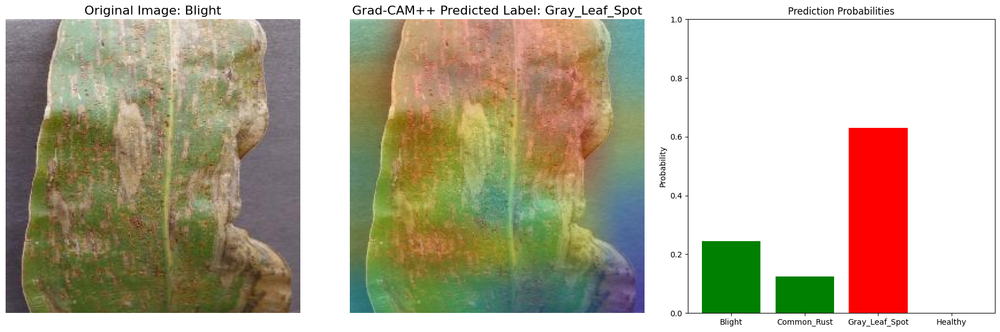

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


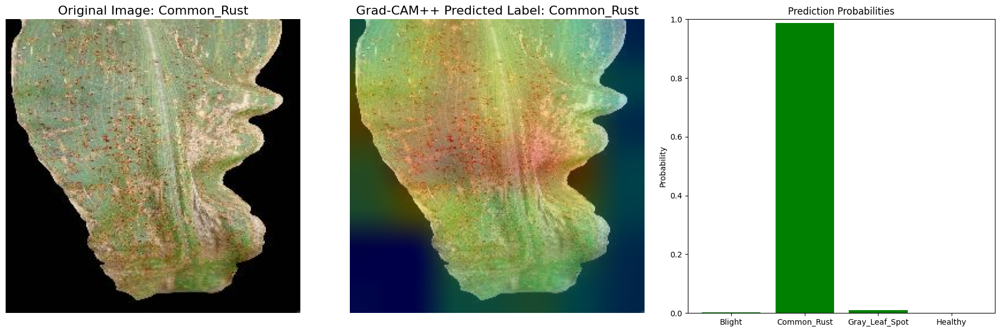

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


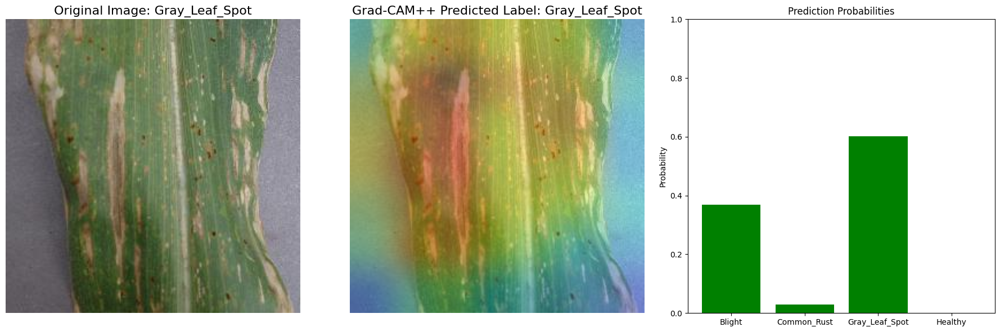

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


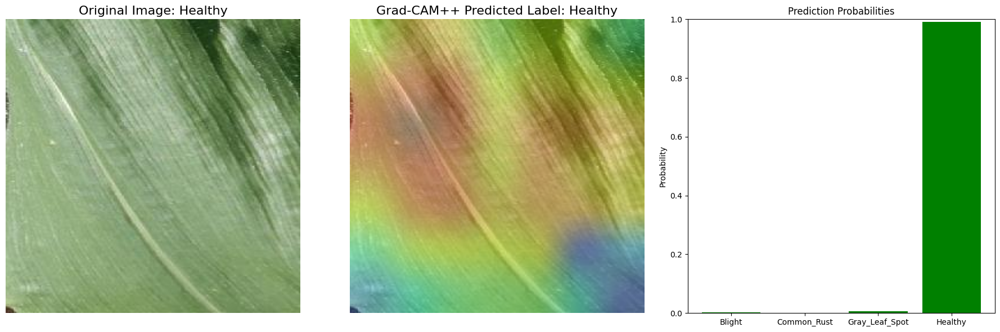

In [60]:
import os
import random
from tensorflow.keras.preprocessing.image import load_img, img_to_array


# The below functions iwll randomly select images from a test dataset, generate Grad-CAM++ heatmaps for visualizing the model's predictions, and display the results.
def get_random_images(test_dir, class_names, img_size):

    random_images = {}
    for class_name in class_names:
        class_dir = os.path.join(test_dir, class_name)
        img_files = os.listdir(class_dir)
        random_img = random.choice(img_files)
        random_images[class_name] = os.path.join(class_dir, random_img)
    return random_images

def visualize_random_images(test_dir, class_names, model, last_conv_layer_name, img_size=224):

    # Get random images from each class
    random_images = get_random_images(test_dir, class_names, img_size)

    for true_label, img_path in random_images.items():
        # Load and preprocess the image
        img_array = get_img_array(img_path, size=img_size)

        # Predict probabilities and class
        predictions = model.predict(img_array)
        predicted_class_probs = predictions[0]
        predicted_class_index = np.argmax(predicted_class_probs)
        predicted_label = class_names[predicted_class_index]

        # Generate Grad-CAM++ heatmap
        heatmap = make_gradcamplus_heatmap(img_array, model, last_conv_layer_name)

        # Plot the visualization
        plot_full_visualization(
            img_path,
            heatmap,
            predicted_class_probs,
            class_names,
            true_label,
            predicted_label
        )

# Define paths and parameters
test_dir = data_dir+'/test'  # Path to your test dataset directory
class_names = ['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']  # Class folder names
last_conv_layer_name = 'Conv_1'  # Last convolutional layer name of MobileNetV2
img_size = 224

# Call the function to visualize
visualize_random_images(test_dir, class_names, model, last_conv_layer_name, img_size=img_size)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


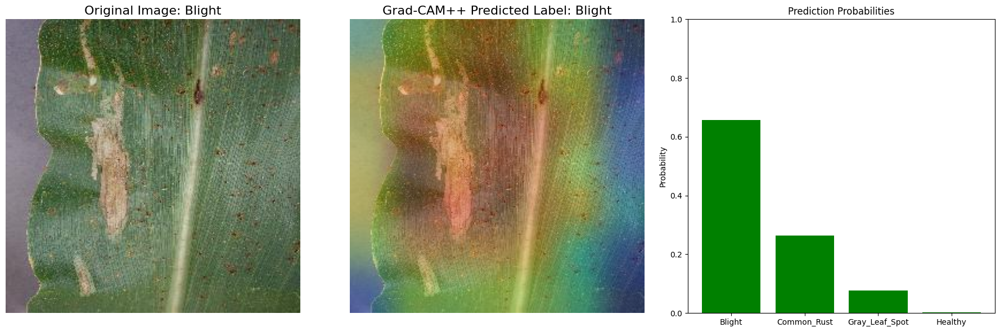

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


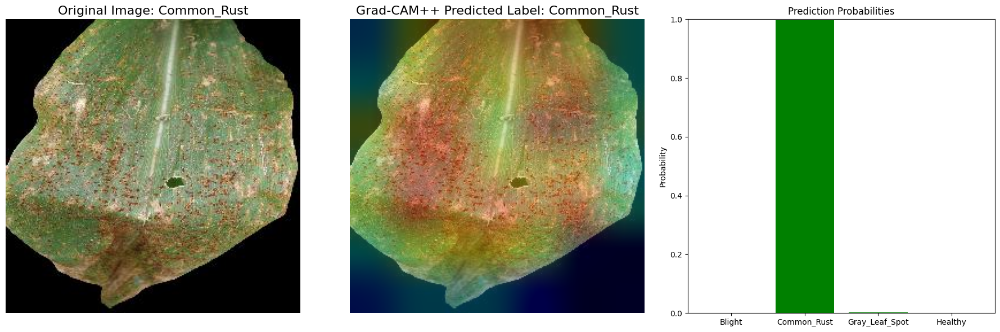

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


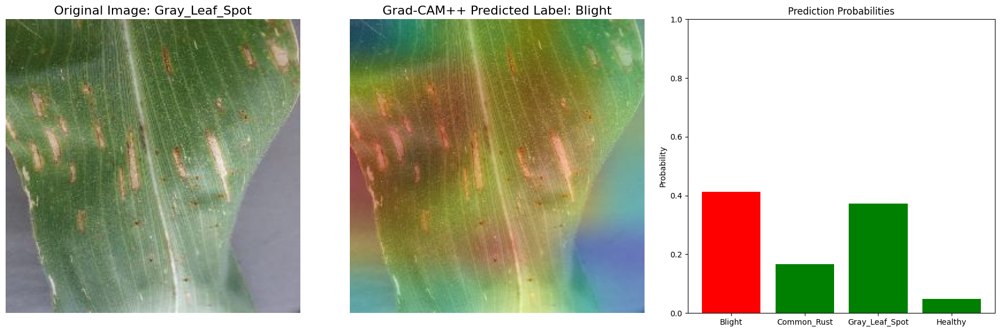

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


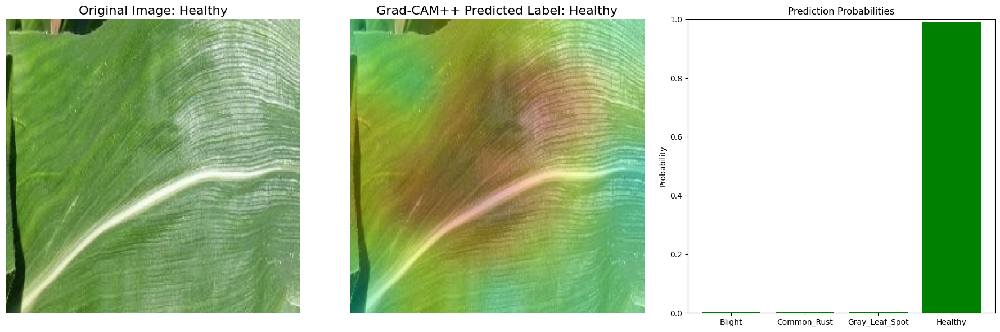

In [61]:
visualize_random_images(test_dir, class_names, model, last_conv_layer_name, img_size=img_size)


In [63]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=36a6500a3d411f7a4043b4de07616f405c85f6ab5f7ab4dcea6b46ebcbc91496
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


# LIME Implementation for MobileNetV2

In [ ]:
# Creating Lime

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from lime import lime_image
from skimage.segmentation import mark_boundaries
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess


In [68]:

# Set your model
model = mobilenetv2_model  # Replace with your trained MobileNetV2 model


In [79]:

# Define preprocessing transform for LIME
def get_preprocess_transform():
    return mobilenet_preprocess  # Use preprocessing for MobileNetV2

preprocess_transform = get_preprocess_transform()


In [78]:

# Define batch prediction function for LIME
def batch_predict(images):
    # Preprocess and predict
    images = np.array([preprocess_transform(img) for img in images])
    predictions = model.predict(images)
    return predictions


In [75]:

# Load and preprocess a sample image
def load_image(image_path, target_size=(224, 224)):
    img = Image.open(image_path)
    # Convert to RGB if not already
    if img.mode != 'RGB':
        img = img.convert('RGB')
    # Resize to the input size expected by the model
    img = img.resize(target_size)
    return np.array(img)


In [76]:

# Path to the image
# image_path = data_dir+'/test/Common_Rust/Corn_Common_Rust (31).JPG'
image_path = data_dir+'/test/Common_Rust/Corn_Common_Rust (1095).JPG'
input_img = load_image(image_path)


In [80]:

# Initialize LIME image explainer
explainer = lime_image.LimeImageExplainer(random_state=42)

# Get the explanation for the top classes
explanation = explainer.explain_instance(
    input_img,
    batch_predict,  # Function for predicting classes
    top_labels=5,
    hide_color=0,
    num_samples=1000  # Number of perturbed samples
)


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━

In [81]:

# Get class names from your test data generator
# class_names = ['Blight', 'Common_Rust', 'Gray Leaf Spot', 'Healthy']

# Predict the probabilities for the top 5 classes
probs = batch_predict(np.expand_dims(input_img, axis=0))[0]
top5_idx = probs.argsort()[-5:][::-1]

print("Top 5 predictions:")
for idx in top5_idx:
    print(f"Class {class_names[idx]}: {probs[idx]:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Top 5 predictions:
Class Common_Rust: 0.8651
Class Gray_Leaf_Spot: 0.0986
Class Blight: 0.0363
Class Healthy: 0.0000


In [69]:
from PIL import Image
import numpy as np


# The below code loads an image from the specified path, converts it to RGB format, resizes it to the target dimensions, and returns it as a NumPy array.

def load_image(image_path, target_size=(224, 224)):
    img = Image.open(image_path)
    img = img.convert("RGB")  # Ensure the image is in RGB format
    img = img.resize(target_size)  # Resize to the target size
    return np.array(img)


In [101]:
class_names

['Blight', 'Common_Rust', 'Gray_Leaf_Spot', 'Healthy']

In [105]:


# image_paths = [
#     data_path+"/Common_Rust/Corn_Common_Rust (31).jpg",
#     data_path+"/Healthy/Corn_Health (9).jpg",
#     data_path+"/Blight/Corn_Blight (985).JPG",
#     data_path+"/Gray_Leaf_Spot/Corn_Gray_Spot (11).jpg"
# ]

image_paths = [
   Testing_Images+"/Common_Rust/Corn_Common_Rust_1.jpg",
    Testing_Images+"/Healthy/Corn_Health_1.jpg",
    Testing_Images+"/Gray_Leaf_Spot/Corn_Gray_Spot_1.JPG",
     Testing_Images+"/Blight/Corn_Blight_2.JPG",
]




1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


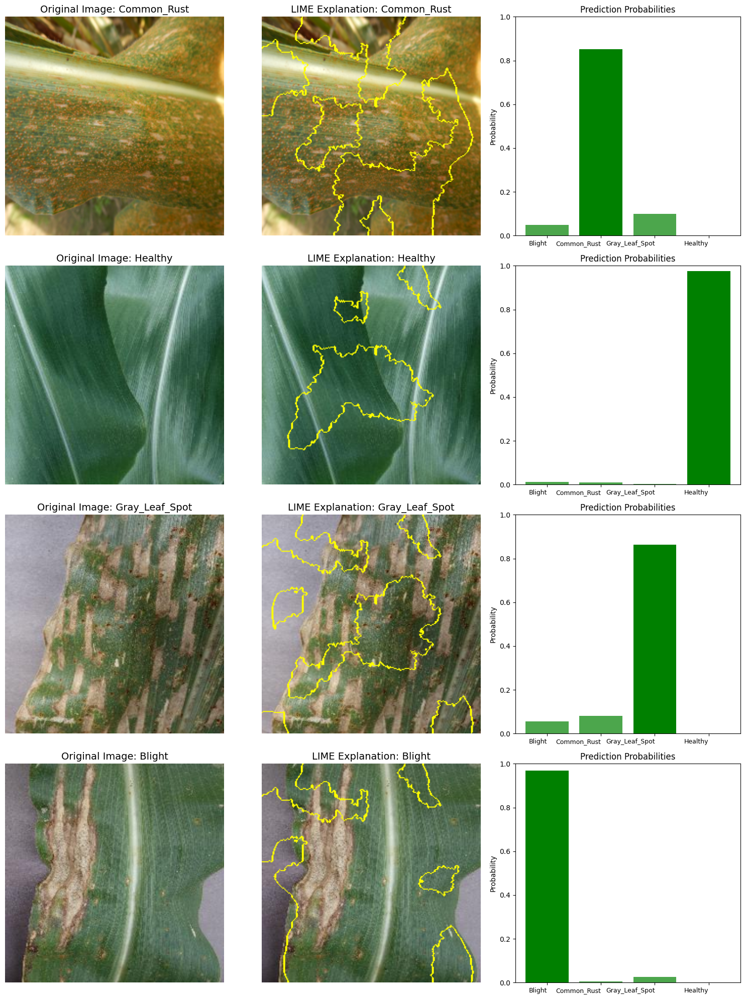

In [106]:
# visualizes LIME explanations for a set of input images by displaying the original image,
#  an explanation overlay with boundaries highlighting important regions, and a bar plot of class probabilities.

def visualize_lime2(image_paths, model, class_names, explainer):


    fig, axes = plt.subplots(len(image_paths), 3, figsize=(15, 5 * len(image_paths)))

    for i, image_path in enumerate(image_paths):


        # Extract true label from the image path using split
        true_label = image_path.split('/')[-2]  # Second-to-last part of the path

        # Load and preprocess the image
        input_img = load_image(image_path)
        img_array = np.expand_dims(input_img, axis=0)

        # Predict probabilities
        probs = batch_predict(img_array)[0]
        predicted_label = np.argmax(probs)
        predicted_class_name = class_names[predicted_label]


        # Get the image and mask for the predicted label
        temp, mask = explanation.get_image_and_mask(
            predicted_label, positive_only=True, num_features=10, hide_rest=False
        )

        # Ensure the temp matches the input image
        temp = input_img.copy()  # Use the original image for overlay

        # Create LIME explanation image with boundaries
        lime_image_with_boundaries = mark_boundaries(temp / 255.0, mask)

        # Plot the original image
        axes[i][0].imshow(input_img)
        axes[i][0].set_title(f"Original Image: {true_label}", fontsize=14)
        axes[i][0].axis('off')

        # Plot the LIME explanation image with boundaries
        axes[i][1].imshow(lime_image_with_boundaries)
        axes[i][1].set_title(f"LIME Explanation: {predicted_class_name}", fontsize=14)
        axes[i][1].axis('off')

        # Plot the class probabilities (vertical bar plot)
        axes[i][2].bar(class_names, probs, color='green', alpha=0.7)
        axes[i][2].bar(class_names[predicted_label], probs[predicted_label], color='green', alpha=1.0)
        axes[i][2].set_ylim(0, 1)  # Set y-axis range for probabilities
        axes[i][2].set_title("Prediction Probabilities", fontsize=12)
        axes[i][2].set_ylabel("Probability", fontsize=10)
        axes[i][2].set_xticks(range(len(class_names)))
        axes[i][2].set_xticklabels(class_names, ha="right", fontsize=9)

    plt.tight_layout()
    plt.show()


# Visualize LIME for the images
visualize_lime2(image_paths, model, class_names, explainer)


In [107]:
# THE BELOW function shows visualization of the most influential regions contributing to the model's predictions.

def visualize_lime_for_multiple_images(image_paths, model, class_names, explainer, last_conv_layer_name):

    fig, axes = plt.subplots(len(image_paths), 3, figsize=(15, 5 * len(image_paths)))

    for i, image_path in enumerate(image_paths):
        # Extract true label from the image path using split
        true_label = image_path.split('/')[-2]  # Second-to-last part of the path

        # Load and preprocess the image
        input_img = load_image(image_path)
        img_array = np.expand_dims(input_img, axis=0)

        # Predict probabilities
        probs = batch_predict(img_array)[0]
        predicted_label = np.argmax(probs)
        predicted_class_name = class_names[predicted_label]


        temp, mask = explanation.get_image_and_mask(
            predicted_label, positive_only=True, num_features=10, hide_rest=False
        )

        # Highlighted image
        highlighted_img = np.zeros_like(input_img)
        highlighted_img[mask == 1] = input_img[mask == 1]

        # Plot the original image
        axes[i][0].imshow(input_img)
        axes[i][0].set_title(f"Original Image: {true_label}", fontsize=14)
        axes[i][0].axis('off')

        # Plot the highlighted image
        axes[i][1].imshow(highlighted_img)
        axes[i][1].set_title(f"Contributing Pixels for : {predicted_class_name}", fontsize=14)
        axes[i][1].axis('off')

        # Plot the class probabilities (vertical bar plot)
        axes[i][2].bar(class_names, probs, color='green', alpha=0.7)
        axes[i][2].bar(class_names[predicted_label], probs[predicted_label], color='green', alpha=1.0)
        axes[i][2].set_ylim(0, 1)  # Set y-axis range for probabilities
        axes[i][2].set_title("Prediction Probabilities", fontsize=12)
        axes[i][2].set_ylabel("Probability", fontsize=10)
        axes[i][2].set_xticks(range(len(class_names)))
        axes[i][2].set_xticklabels(class_names, ha="right", fontsize=9)

    plt.tight_layout()
    plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


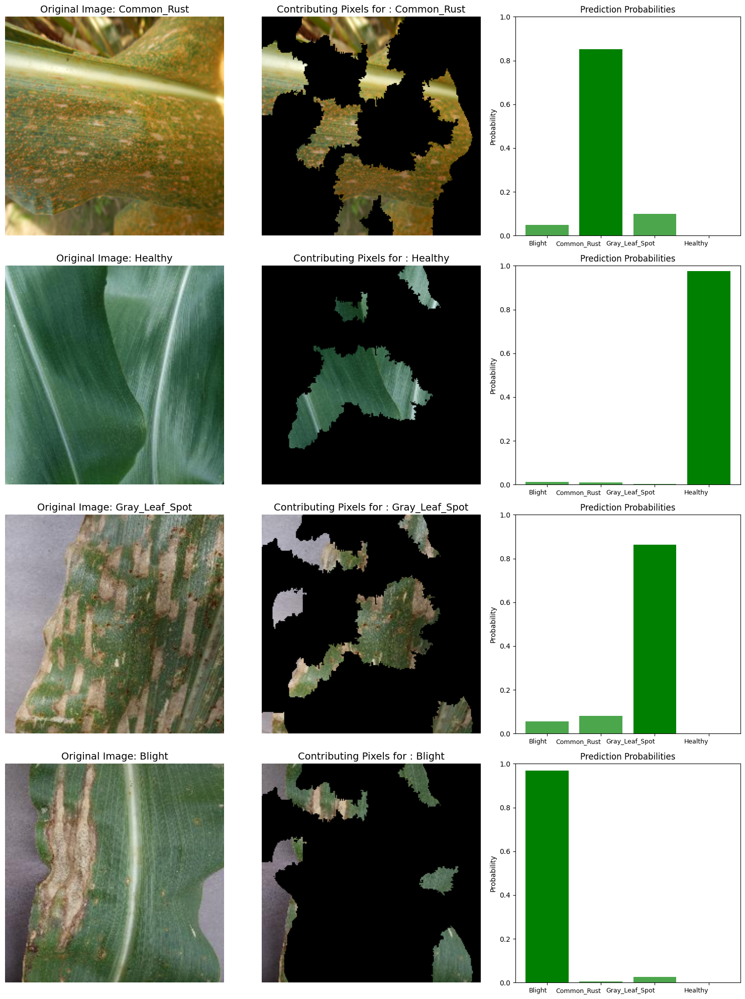

In [108]:

# Visualize LIME for the images
visualize_lime_for_multiple_images(image_paths, model, class_names, explainer, last_conv_layer_name="Conv_1")
